# Transfer Learning Explained

Transfer learning is a powerful technique that allows us to leverage the knowledge gained from solving one problem and apply it to a different, but related, problem.

## The Core Idea:

Instead of training a model from scratch for a new task, we can take a pre-trained model (a model that has already learned patterns from a massive dataset) and adapt it to our specific problem.

## How it Works:

*   **Reusing Learned Patterns:** A pre-trained model has already learned to identify features and patterns in the data it was trained on. These learned patterns (represented by the model's weights) can often be useful for other tasks.
*   **Adapting to a New Problem:** We can take the pre-trained model and modify it for our new task. This often involves removing the last layer(s) of the pre-trained model (which are specific to the original task) and adding new layers that are trained on our new data.
*   **Faster Training and Better Performance:** By starting with a pre-trained model, we can significantly reduce the training time and often achieve better performance, especially when we have limited data for our new task.

## Examples:

*   **Computer Vision:** Using a model trained on ImageNet (millions of images) to classify images of food. The ImageNet model has learned to identify basic features like edges, shapes, and textures, which are also relevant for recognizing food items.
*   **Natural Language Processing:** Using a language model trained on a massive text corpus to classify text samples by sentiment or topic. The language model has learned a rich representation of language that can be fine-tuned for various text-related tasks.

In essence, transfer learning is about finding a well-performing existing model and applying its learned knowledge to your own problem.

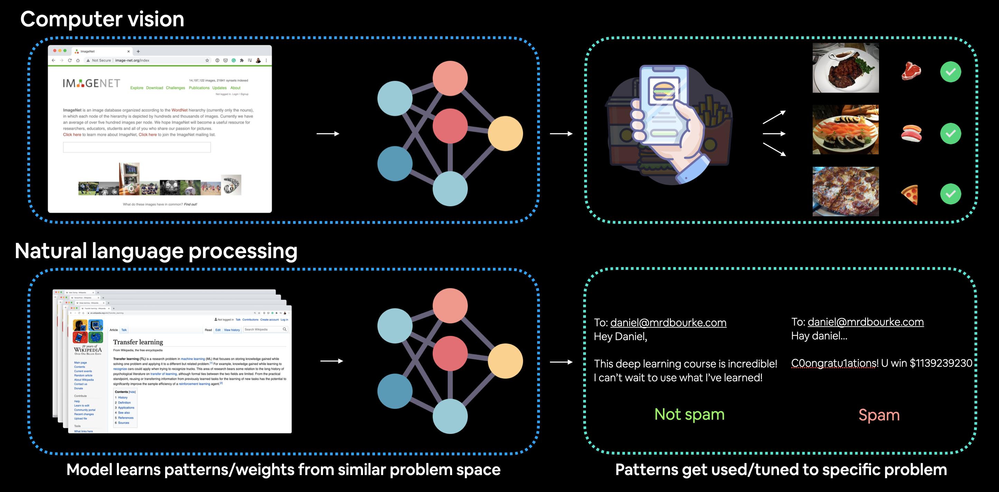

The image outlines two main benefits of using transfer learning:

*   **Leveraging an existing model:** You can use an existing model (usually a neural network architecture) that has already been proven effective on problems similar to your own.
*   **Using an already-trained model:** You leverage a working model that has already learned patterns on similar data to your own. This often leads to achieving great results with less custom data.

## The image lists four main places to find pretrained models and describes what each location offers:

| Location                     | What's There?                                                                                                                                |
| :--------------------------- | :------------------------------------------------------------------------------------------------------------------------------------------- |
| PyTorch domain libraries     | Each of the PyTorch domain libraries (torchvision, torchtext, etc.) come with pretrained models of some form. The models work right within PyTorch. |
| HuggingFace Hub              | A series of pretrained models on many different domains (vision, text, audio and more) from organizations around the world. There's plenty of different datasets too. |
| timm (PyTorch Image Models)  | Almost all of the latest and greatest computer vision models in PyTorch code as well as plenty of other helpful computer vision features.           |
| Paperswithcode               | A collection of the latest state-of-the-art machine learning papers with code implementations attached. You can also find benchmarks here of model performance on different tasks. |

## The image provides a table of contents for a section, which focuses on taking a pretrained model from torchvision.models and customising it for the "FoodVision Mini" problem.

Here are the topics and their contents:

| Topic                                                 | Contents                                                                                                                                                                                               |
| :---------------------------------------------------- | :----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| 0. Getting setup                                      | We've written a fair bit of useful code over the past few sections, let's download it and make sure we can use it again.                                                                             |
| 1. Get data                                           | Let's get the pizza, steak, and sushi image classification dataset we've been using to try and improve our model's results.                                                                              |
| 2. Create Datasets and DataLoaders                    | We'll Create Datasets and DataLoaders to setup our DataLoaders.                                                                                                                                        |
| 3. Get and customise a pretrained model               | Here we'll download a pretrained model from torchvision.models and customise it to our own problem.                                                                                                    |
| 4. Train model                                        | Let's see how the new pretrained model goes on our pizza, steak, sushi dataset. We'll use the training functions we created in the previous chapter.                                                 |
| 5. Evaluate the model by plotting loss curves         | How did our first transfer learning model go? Did it overfit or underfit?                                                                                                                              |
| 6. Make predictions on images from the test set       | It's one thing to check out a model's evaluation metrics but it's another thing to view its predictions on test samples, let's visualize, visualize!                                                    |
| 7. Using a ViT Model (torchvision)                    | This step will use ViT Model from torchvision.                                                                                                                                                         |
| 8. Using a ViT Model With HuggingFace Trainer Module  | This step will use ViT Model from HF Trainer.                                                                                                                                                          |
| 9. Making predictions with our trained models and timing them | This step will check the predictions with our trained models and timing them.                                                                                                                          |
| 10. Comparing model results, prediction times and size | This step will compare model results, prediction times and size.                                                                                                                                       |

# 0. Getting Setup

In [ ]:
!pip install datasets

In [ ]:
import torch
import torchvision
from torchvision import datasets
from torch.utils.data import DataLoader

print(f"torch version: {torch.__version__}")
print(f"torchvision version: {torchvision.__version__}")

torch version: 2.8.0+cu126
torchvision version: 0.23.0+cu126


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. Get data

In [ ]:
import os
import zipfile
import shutil
from pathlib import Path

# PyTorch and TorchVision imports for model building later
import torch
import torchvision
from torchvision import datasets
from torch.utils.data import DataLoader

# --- 0. Getting Setup: Imports and Version Check (from image_e052df.png) ---
print(f"torch version: {torch.__version__}")
print(f"torchvision version: {torchvision.__version__}")
print("-" * 30)

# --- 1. Get Data (from image_e051e4.png and image_e04e1e.jpg) ---

# NOTE: This specific code block relies on a Google Colab environment.
# Before running this, you must execute the Colab commands to mount your Drive:
# from google.colab import drive
# drive.mount('/content/drive')

# Setup path to data folder
data_path = Path("data")

# Define paths: Source on Google Drive and destination for the copied zip file
image_path = data_path / "pizza_steak_sushi"
google_drive_path = Path("/content/drive/MyDrive/pizza_steak_sushi .zip")
local_path = data_path / "pizza_steak_sushi .zip"

# If the image folder doesn't exist, download and prepare it...
if image_path.is_dir():
    print(f"[INFO] {image_path} directory already exists. Skipping download/unzip.")
else:
    print(f"[INFO] Did not find {image_path} directory.")
    print("[INFO] Creating parent directories if necessary...")
    # Ensure all parent directories are created
    data_path.mkdir(parents=True, exist_ok=True)
    image_path.mkdir(parents=True, exist_ok=True) # This is where extracted files will go

    # Copy the zip file from Google Drive to local Colab environment
    try:
        print(f"[INFO] Attempting to copy file from Google Drive: {google_drive_path}")
        shutil.copy(google_drive_path, local_path)
        print(f"[SUCCESS] Copied pizza, steak, sushi data from Google Drive to {local_path}.")

        # Unzip pizza, steak, sushi data
        print("Unzipping pizza, steak, sushi data...")
        # zipfile.ZipFile expects a string or Path object
        with zipfile.ZipFile(local_path, "r") as zip_ref:
            # Extract all contents into the final image_path directory
            zip_ref.extractall(image_path)
        print(f"[SUCCESS] Data unzipped successfully into {image_path}.")

        # Remove .zip file for cleanup
        os.remove(local_path)
        print(f"[INFO] Removed temporary zip file: {local_path}.")

    except FileNotFoundError:
        print(f"[ERROR] Could not find file. Ensure your Google Drive is mounted, and the path '{google_drive_path}' is correct.")
    except Exception as e:
        print(f"[CRITICAL ERROR] Failed during copy or unzip process. Details: {e}")

# Final data check


torch version: 2.8.0+cu126
torchvision version: 0.23.0+cu126
------------------------------
[INFO] Did not find data/pizza_steak_sushi directory.
[INFO] Creating parent directories if necessary...
[INFO] Attempting to copy file from Google Drive: /content/drive/MyDrive/pizza_steak_sushi .zip
[SUCCESS] Copied pizza, steak, sushi data from Google Drive to data/pizza_steak_sushi .zip.
Unzipping pizza, steak, sushi data...
[SUCCESS] Data unzipped successfully into data/pizza_steak_sushi.
[INFO] Removed temporary zip file: data/pizza_steak_sushi .zip.


In [ ]:
train_dir = image_path / "pizza_steak_sushi" / "train"
test_dir = image_path / "pizza_steak_sushi" / "test"

# 2. Create dataset and dataloader

## 2.1 Creating a transform for torchvision.models (manual creation)

All pre-trained models expect input images normalized in the same way, i.e., mini-batches of 3-channel RGB images of shape 3×H×W, where H and W are expected to be at least 224.

The images have to be loaded into a range of [0,1] and then normalized using:

*   mean: `[0.485, 0.456, 0.406]`
*   std: `[0.229, 0.224, 0.225]`

You can use the following transform to normalize:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

The good news is, we can achieve the above transformations with a combination of the following steps:

| Transform number | Transform required                                                       | torchvision.transforms Function      |
| :--------------- | :----------------------------------------------------------------------- | :----------------------------------- |
| 1                | Mini-batches of size [batch\_size,3,height,width] where height and width are at least 224×224. | `torchvision.transforms.Resize()`    |
| 2                | Values between 0 and 1.                                                  | `torchvision.transforms.ToTensor()`  |
| 3                | A mean of [0.485,0.456,0.406] (values across each colour channel).       | `torchvision.transforms.Normalize()` |
| 4                | A standard deviation of [0.229,0.224,0.225] (values across each colour channel). | `torchvision.transforms.Normalize()` |

In [ ]:
#manually transform
manual_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224,224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
from typing import Tuple, List
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

def create_dataloader(
    train_dir: str,
    test_dir: str,
    transform: transforms.Compose,
    batch_size: int,
    num_workers: int=2
) -> Tuple[DataLoader, DataLoader, List[str]]:
    """
    Creates PyTorch DataLoaders for image classification.

    Args:
        train_dir: Path to the training directory.
        test_dir: Path to the testing directory.
        transform: torchvision.transforms to apply to images.
        batch_size: Number of samples per batch.
        num_workers: Number of subprocesses to use for data loading.

    Returns:
        A tuple of (train_dataloader, test_dataloader, class_names).
    """

    # 1. Use ImageFolder to create dataset(s)
    train_data = datasets.ImageFolder(train_dir, transform=transform)
    test_data = datasets.ImageFolder(test_dir, transform=transform)

    # 2. Get class names
    class_names = train_data.classes
    print(f"Class names: {class_names}")

    # 3. Turn images into data loaders
    train_dataloader = DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )

    test_dataloader = DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=False, # don't need to shuffle test data
        num_workers=num_workers,
        pin_memory=True,
    )

    return train_dataloader, test_dataloader, class_names


In [ ]:
# creating testing and training dataloader
train_dataloader,test_dataloader, class_names = create_dataloader(train_dir, test_dir, manual_transform, batch_size=32)
train_dataloader,test_dataloader, class_names

Class names: ['pizza', 'steak', 'sushi']


(<torch.utils.data.dataloader.DataLoader at 0x79776492bd10>,
 ['pizza', 'steak', 'sushi'])

## 2.3 Creating a transform for torchvision.models (auto creation)

As previously stated, when using a pretrained model, it's important that your custom data going into the model is prepared in the same way as the original training data that went into the model.

Above we saw how to manually create a transform for a pretrained model.

But as of torchvision v0.13+, an automatic transform creation feature has been added.

When you setup a model from `torchvision.models` and select the pretrained model weights you'd like to use, for example, say we'd like to use:

In [ ]:
# Example of getting weights
# import torchvision.models as models # You would need to import models
# weights = models.EfficientNet_B0_Weights.DEFAULT # Example weights

Where,

*   **EfficientNet_B0_Weights** is the model architecture weights we'd like to use (there are many different model architecture options in `torchvision.models`).
*   **DEFAULT** means the best available weights (the best performance in ImageNet).

Note: Depending on the model architecture you choose, you may also see other options such as `IMAGENET_V1` and `IMAGENET_V2` where generally the higher version number the better. Though if you want the best available, `DEFAULT` is the easiest option. See the `torchvision.models` documentation for more.

EfficientNet_B0_Weights.IMAGENET1K_V1

And now to access the transforms associated with our weights, we can use the transforms() method.

This is essentially saying 'get the data transforms that were used to train the EfficientNet_B0_Weights on ImageNet'.

In [ ]:
[13] # Get a set of pretrained model weights
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights from pretraining on ImageNet
weights

# Get the transforms used to create our pretrained weights
auto_transforms = weights.transforms()
auto_transforms


ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [ ]:
 # create training and testing dataloader using auto transform
 train_dataloader,test_dataloader, class_names = create_dataloader(train_dir, test_dir, auto_transforms, batch_size=32)
 train_dataloader,test_dataloader, class_names

Class names: ['pizza', 'steak', 'sushi']


(<torch.utils.data.dataloader.DataLoader at 0x797764c6c8f0>,
 ['pizza', 'steak', 'sushi'])

# 3. Getting a pretrained model

Since we're working on a computer vision problem (image classification with FoodVision Mini), we can find pretrained classification models in `torchvision.models`.

Exploring the documentation, you'll find plenty of common computer vision architecture backbones such as:

| Architecture backbone                       | Code                                                                      |
| :------------------------------------------ | :------------------------------------------------------------------------ |
| ResNet's                                    | `torchvision.models.resnet18()`, `torchvision.models.resnet50()` ...      |
| VGG (similar to what we used for TinyVGG)   | `torchvision.models.vgg16()`                                              |
| EfficientNet's                              | `torchvision.models.efficientnet_b0()`, `torchvision.models.efficientnet_b1()` ... |
| VisionTransformer (ViT's)                   | `torchvision.models.vit_b_16()`, `torchvision.models.vit_b_32()`          |
| ConvNeXT                                    | `torchvision.models.convnext_tiny()`, `torchvision.models.convnext_small()` |
| More available in `torchvision.models`      | `torchvision.models...`                                                   |

## 3.1 Which pretrained model should you use?

It depends on your problem/the device you're working with.

Generally, the higher number in the model name (e.g. efficientnet_b0() → efficientnet_b1() → efficientnet_b7()) means better performance but a larger model.

You might think better performance is always better, right?

That's true but some better performing models are too big for some devices.

For example, say you'd like to run your model on a mobile-device, you'll have to take into account the limited compute resources on the device, thus you'd be looking for a smaller model.

Understanding this performance vs. speed vs. size tradeoff will come with time and practice.

For me, I've found a nice balance in the efficientnet_bX models.

**Note:** Even though we're using `efficientnet_bX`, it's important not to get too attached to any one architecture, as they are always changing as new research gets released. Best to experiment, experiment, experiment and see what works for your problem.

## 3.2 Setting up a pretrained model

The pretrained model we're going to be using is `torchvision.models.efficientnet_b0()`.

The architecture is from the paper ["EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks"](https://arxiv.org/abs/1905.11946).

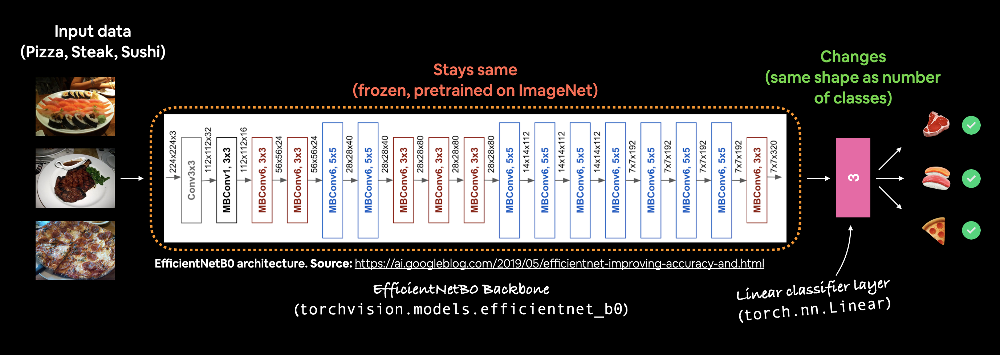

*Example of what we're going to create, a pretrained EfficientNet B0 model from torchvision.models with the output layer adjusted for our use case of classifying pizza, steak and sushi images.*

*We can setup the EfficientNet_B0 pretrained ImageNet weights using the same code as we used to create the transforms.*

In [ ]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights for ImageNet

*This means the model has already been trained on millions of images and has a good base representation of image data.*

*The PyTorch version of this pretrained model is capable of achieving ≈77.7% accuracy across ImageNet's 1000 classes.*

*We'll also send it to the target device.*

In [ ]:
# OLD: Setup the model with pretrained weights and send it to the target device (this was prior to torchvision v0.13)
# model = torchvision.models.efficientnet_b0(pretrained=True).to(device) # OLD method (with pretrained=True)

# NEW: Setup the model with pretrained weights and send it to the target device (torchvision v0.13+)
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights
effnet = torchvision.models.efficientnet_b0(weights=weights)

effnet

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 157MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

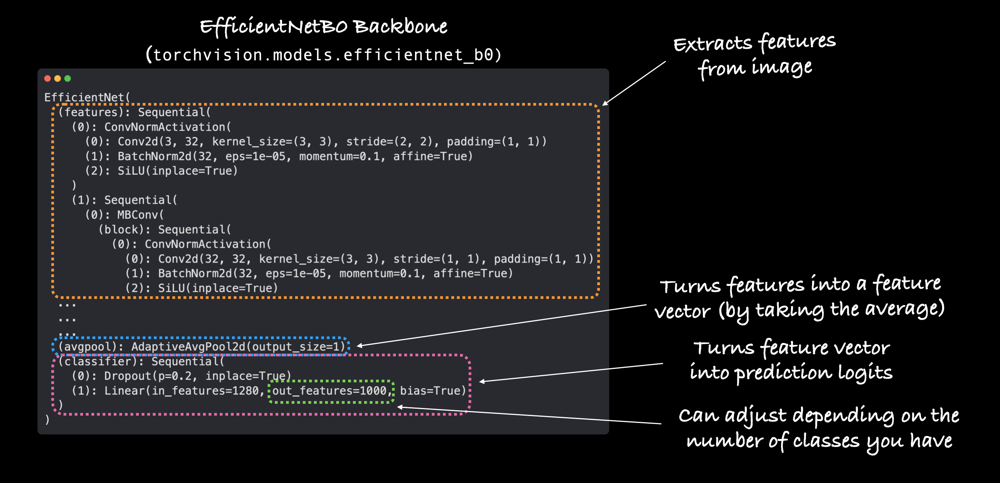

To learn more about our model, let's use [`torchinfo.summary()`](https://github.com/TylerYe/torchinfo)'s `summary()` method.

To do so, we'll pass in:

*   **model** - the model we'd like to get a summary of.
*   **input\_size** - the shape of the data we'd like to pass to our model, for the case of efficientnet\_b0, the input size is `(batch_size, 3, 224, 224)`, though other variants of efficientnet bx have different input sizes.

**Note:** Many modern models can handle input images of varying sizes thanks to `torch.nn.AdaptiveAvgPool2d()`, this layer adaptively adjusts the `output_size` of a given input as required. You can try this out by passing different size input images to `summary()` or your models.

*   **col\_names** - the various information columns we'd like to see about our model.
*   **col\_width** - how wide the columns should be for the summary.
*   **row\_settings** - what features to show in a row.

In [ ]:
!pip install torchinfo

In [ ]:
from torchinfo import summary

summary(
    model=effnet,
    input_size=(32, 3, 224, 224), # 32 is a typical batch size, 3 channels, 224x224 image size
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=20,
    row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

Woah!

Now that's a big model!

From the output of the summary, we can see all of the various input and output shape changes as our image data goes through the model.

And there are a whole bunch more total parameters (pretrained weights) to recognize different patterns in our data.

For reference, our model from previous sections, *TinyVGG* had 8,083 parameters vs. 5,288,548 parameters for *efficientnet_b0*, an increase of ~654x!

# 3.4 Freezing the base model and changing the output layer to suit our needs

The process of transfer learning usually goes: freeze some base layers of a pretrained model (typically the features section) and then adjust the output layers (also called head/classifier layers) to suit your needs.

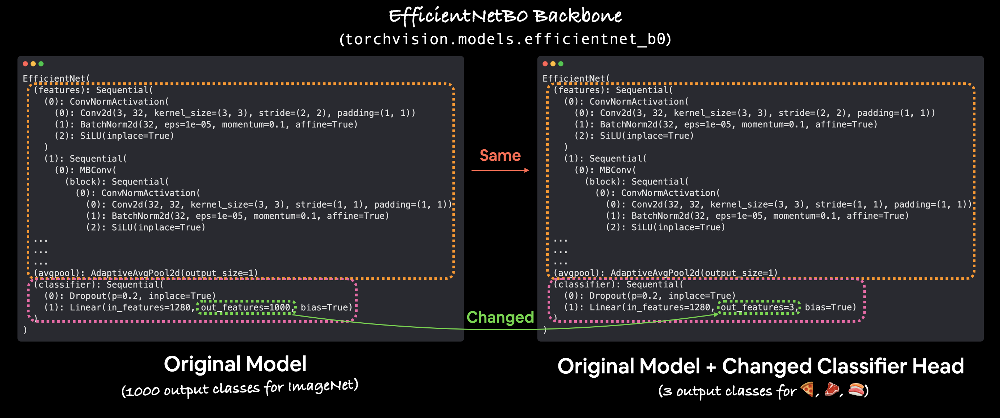

# _Text Extraction from Images_

**You can customise the outputs of a pretrained model by changing the output layer(s) to suit your problem. The original torchvision.models.efficientnet_b0() comes with `out_features=1000` because there are 1000 classes in ImageNet, the dataset it was trained on. However, for our problem, classifying images of pizza, steak and sushi we only need `out_features=3`.**

**Let's freeze all of the layers/parameters in the features section of our `efficientnet_b0` model.**

*Note: To freeze layers means to keep them how they are during training. For example, if your model has pretrained layers, to freeze them would be to say, "don't change any of the patterns in these layers during training, keep them how they are." In essence, we'd like to keep the pretrained weights/patterns our model has learned from ImageNet as a backbone and then only change the output layers.*

**We can freeze all of the layers/parameters in the features section by setting the attribute `requires_grad=False`.**

*For parameters with `requires_grad=False`, PyTorch doesn't track gradient updates and in turn, these parameters won't be changed by our optimizer during training.*

*In essence, a parameter with `requires_grad=False` is "untrainable" or "frozen" in place.*

In [ ]:
for name, param in effnet.named_parameters():
    if param.requires_grad:
        print(name)

features.0.0.weight
features.0.1.weight
features.0.1.bias
features.1.0.block.0.0.weight
features.1.0.block.0.1.weight
features.1.0.block.0.1.bias
features.1.0.block.1.fc1.weight
features.1.0.block.1.fc1.bias
features.1.0.block.1.fc2.weight
features.1.0.block.1.fc2.bias
features.1.0.block.2.0.weight
features.1.0.block.2.1.weight
features.1.0.block.2.1.bias
features.2.0.block.0.0.weight
features.2.0.block.0.1.weight
features.2.0.block.0.1.bias
features.2.0.block.1.0.weight
features.2.0.block.1.1.weight
features.2.0.block.1.1.bias
features.2.0.block.2.fc1.weight
features.2.0.block.2.fc1.bias
features.2.0.block.2.fc2.weight
features.2.0.block.2.fc2.bias
features.2.0.block.3.0.weight
features.2.0.block.3.1.weight
features.2.0.block.3.1.bias
features.2.1.block.0.0.weight
features.2.1.block.0.1.weight
features.2.1.block.0.1.bias
features.2.1.block.1.0.weight
features.2.1.block.1.1.weight
features.2.1.block.1.1.bias
features.2.1.block.2.fc1.weight
features.2.1.block.2.fc1.bias
features.2.1.blo

In [ ]:
# Freeze all base layers in the "features" section of the model (the feature extractor) by setting requires_grad=False
for param in effnet.features.parameters():
    param.requires_grad = False

for name, param in effnet.named_parameters():
    if param.requires_grad:
        print(name)

classifier.1.weight
classifier.1.bias


In [ ]:
# Set the manual seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Get the length of class_names (one output unit for each class)
output_shape = len(class_names)

# Recreate the classifier layer and seed it to the target device
effnet.classifier = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=1280,
                    out_features=output_shape, # same number of output units as our number of classes
                    bias=True))

In [ ]:
summary(
    effnet,
    input_size=(32,3, 224, 224),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=20,
    row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

# 4. Train Model

Now we've got a pretrained model that's semi-frozen and has a customised classifier, how about we see transfer learning in action?

To begin training, let's create a loss function and an optimizer.

Because we're still working with multi-class classification, we'll use `nn.CrossEntropyLoss()` for the loss function.

And we'll stick with `torch.optim.Adam()` as our optimizer with `lr=0.001`.

In [ ]:
# Define loss and optimizer
import torch.nn as nn
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(effnet.parameters(), lr=0.001)

In [ ]:
"""
Contains functions for training and testing a PyTorch model.
"""
import torch
from tqdm.auto import tqdm
from typing import Dict, List, Tuple, Union

def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    Args:
      model: A PyTorch model to be trained.
      dataloader: A DataLoader instance for the model to be trained on.
      loss_fn: A PyTorch loss function to minimize.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
      A tuple of training loss and training accuracy metrics.
      In the form (train_loss, train_accuracy). For example:
      (0.1112, 0.8743)
    """
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred) # This calculation is often more complex in real code, but I'll use the snippet's logic

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc


def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    Args:
      model: A PyTorch model to be tested.
      dataloader: A DataLoader instance for the model to be tested on.
      loss_fn: A PyTorch loss function to calculate loss on the test data.
      device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
      A tuple of testing loss and testing accuracy metrics.
      In the form (test_loss, test_accuracy). For example:
      (0.0223, 0.8985)
    """
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for X, y in dataloader:
            # Send data to target device
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            # The original snippet was cut off here, so I'm completing it based on typical PyTorch testing logic
            test_acc += ((test_pred_labels == y).sum().item() / len(test_pred_labels))

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc


def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on the test data.
      epochs: An integer specifying how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each value is a list of results for each
      epoch.
      For example:
      {
        "train_loss": [2.0616, 1.0537],
        "train_acc": [0.3945, 0.3945],
        "test_loss": [1.2641, 1.5706],
        "test_acc": [0.3400, 0.2973]
      }
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []}

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer,
                                           device=device)

        test_loss, test_acc = test_step(model=model,
                                        dataloader=test_dataloader,
                                        loss_fn=loss_fn,
                                        device=device)

        # Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

    # Return the filled results at the end of the epochs
    return results

In [ ]:
# Set the random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Setup device-agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"[INFO] Using device: {device}")

# Setup training and save the results
results = train(model=effnet,
                train_dataloader=train_dataloader,
                test_dataloader=test_dataloader,
                optimizer=optimizer,
                loss_fn=loss_fn,
                epochs=5,
                device=device)

# -----------------
# end time
# -----------------
end_time = timer()
total_time = end_time - start_time

# Print the total elapsed time (formatted)
print(f"[INFO] Total training time: {total_time:.3f} seconds")
# -----------------

[INFO] Using device: cuda


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.6569 | train_acc: 0.7697 | test_loss: 0.3338 | test_acc: 0.9137
Epoch: 2 | train_loss: 0.4053 | train_acc: 0.8727 | test_loss: 0.2577 | test_acc: 0.9319
Epoch: 3 | train_loss: 0.3322 | train_acc: 0.8907 | test_loss: 0.2159 | test_acc: 0.9323
Epoch: 4 | train_loss: 0.2902 | train_acc: 0.9070 | test_loss: 0.1940 | test_acc: 0.9410
Epoch: 5 | train_loss: 0.2915 | train_acc: 0.8971 | test_loss: 0.1872 | test_acc: 0.9440
[INFO] Total training time: 118.721 seconds


# 4.Evaluate model by plotting loss curve

In [ ]:
import matplotlib.pyplot as plt
from typing import Dict, List

def plot_loss_curves(results: Dict[str, List]):
    """
    Plots training curves of a results dictionary.

    Args:
        results (dict): dictionary containing list of values, e.g.
            {"train_loss": [...],
             "train_acc": [...],
             "test_loss": [...],
             "test_acc": [...]}
    """

    # Get the metrics from the results dictionary
    loss = results["train_loss"]
    test_loss = results["test_loss"]
    accuracy = results["train_acc"]
    test_accuracy = results["test_acc"]

    # Create a range of epochs for the x-axis
    epochs = range(len(results["train_loss"]))

    # Setup the plot figure
    plt.figure(figsize=(15, 7))

    # --- 1. Plot Loss ---
    plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st plot
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, test_loss, label="test_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # --- 2. Plot Accuracy ---
    plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd plot
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, test_accuracy, label="test_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

    # Ensure plots don't overlap and then display them
    plt.tight_layout()
    plt.show()


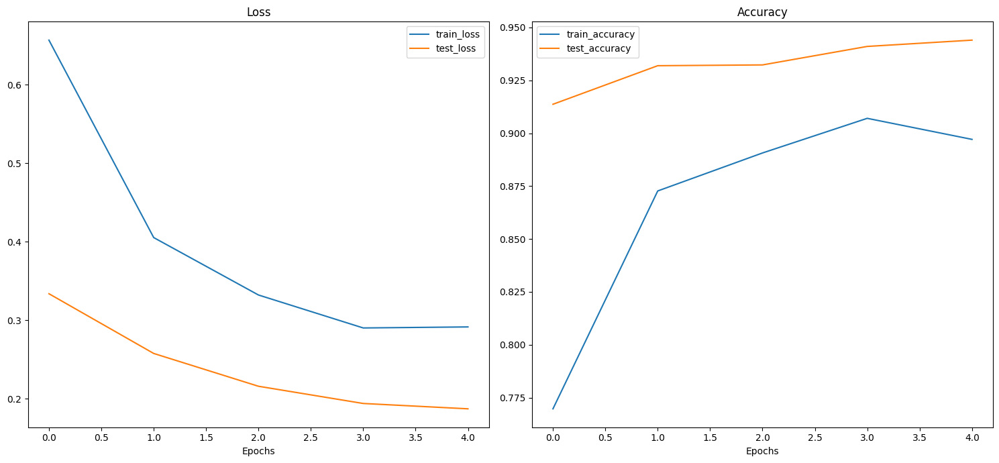

In [ ]:
plot_loss_curves(results)

In [ ]:
from typing import List, Tuple
from PIL import Image
import torch
from torch import nn
from torchvision import transforms
import matplotlib.pyplot as plt

def pred_and_plot_image(
    model: nn.Module,
    image_path: str,
    class_names: List[str],
    image_size: Tuple[int, int] = (224, 224),
    transform: transforms.Compose = None,
    device: torch.device = torch.device("cpu")
):
    """
    Makes a prediction on a single image and plots it with the predicted label and probability.

    Args:
        model (nn.Module): Trained PyTorch model.
        image_path (str): Path to the target image.
        class_names (List[str]): List of class names in correct order.
        image_size (Tuple[int, int], optional): Resize size. Defaults to (224, 224).
        transform (torchvision.transforms.Compose, optional): Preprocessing transform. Defaults to None.
        device (torch.device, optional): Target device ('cpu' or 'cuda').
    """
    # 1. Open the image
    img = Image.open(image_path).convert("RGB")

    # 2. Create transformation for image (if one doesn’t exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    # 3. Ensure the model is on the target device
    model.to(device)

    # 4. Turn on evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
        # 5. Transform and add extra dimension [1, C, H, W]
        transformed_image = image_transform(img).unsqueeze(dim=0).to(device)

        # 6. Make a prediction
        target_image_pred = model(transformed_image)

        # 7. Convert logits → probabilities
        target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

        # 8. Get predicted class index
        target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # 9. Plot image with prediction
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis(False)

    # Get prediction info
    pred_label = class_names[target_image_pred_label]
    pred_prob = target_image_pred_probs.max().item() * 100

    plt.title(f"Pred: {pred_label} ({pred_prob:.2f}%)", fontsize=14)
    plt.show()

    return pred_label, pred_prob


Selected 3 random images for prediction.


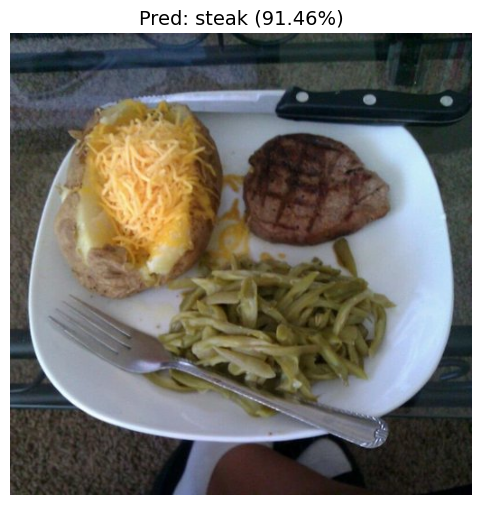

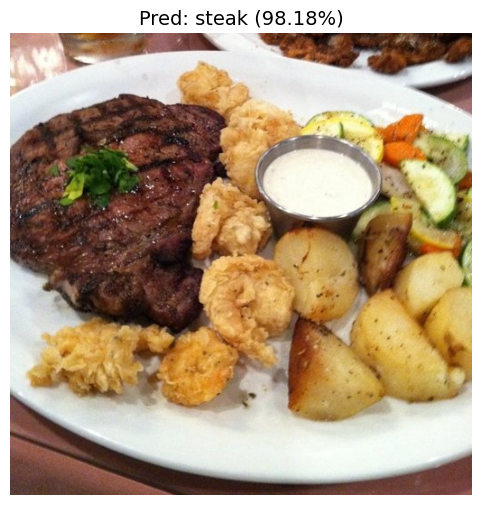

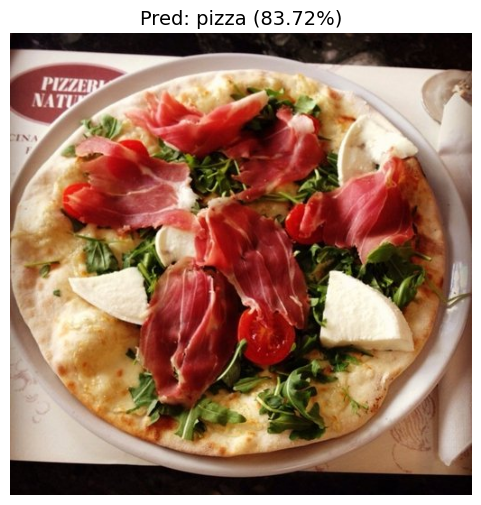

In [ ]:
import random
from pathlib import Path
import torch # Needed to access weights.transforms() and device/model objects

# --- NOTE: You must define these variables based on your setup ---
# test_dir (Path): Path object pointing to your test data directory
# effnet (torch.nn.Module): Your trained model
# class_names (List[str]): List of your class names
# weights (torchvision.models.EfficientNet_B0_Weights): Weights object used for model setup
# ----------------------------------------------------------------

# 1. Get a random list of image paths from the test set
num_images_to_plot = 3

# Get all image paths from test data
# This assumes images are directly in test_dir or in subdirectories
# Note: You may need to adjust the glob pattern depending on your test_dir structure
try:
    # Assuming the existence of 'test_dir' (a Path object)
    test_image_path_list = list(Path(test_dir).glob("*/*/*.jpg"))  # Example for structured dataset
    if not test_image_path_list:
        test_image_path_list = list(Path(test_dir).glob("*/*.jpg")) # Example for flat directory
        if not test_image_path_list:
             test_image_path_list = list(Path(test_dir).glob("*/*.jpeg")) # Check for jpeg

except NameError:
    print("Error: 'test_dir' variable is not defined. Cannot find image paths.")
    test_image_path_list = [] # Initialize empty list to prevent crash

# Randomly select 'k' image paths to pred and plot
if test_image_path_list:
    # Ensure k is not larger than the available list size
    k_sample = min(num_images_to_plot, len(test_image_path_list))
    test_image_path_sample = random.sample(
        population=test_image_path_list,
        k=k_sample
    )
    print(f"Selected {k_sample} random images for prediction.")
else:
    test_image_path_sample = []


# 2. Make predictions on and plot the images
if test_image_path_sample:
    for image_path in test_image_path_sample:
        # Assuming pred_and_plot_image function is defined and effnet is trained
        # and weights.transforms() is available (likely from the weights object used
        # to initialize the pretrained model).
        try:
            pred_and_plot_image(
                model=effnet,
                image_path=image_path,
                class_names=class_names,
                # Optionally pass in a specified transform from our pretrained weights
                transform=weights.transforms(),
                image_size=(224, 224)
            )
        except NameError as e:
            print(f"Error during prediction loop: {e}. Ensure 'effnet', 'class_names', 'weights', and 'pred_and_plot_image' are defined.")


In [ ]:
def save_model(model: torch.nn.Module,
               target_dir: str,
               model_name: str):
    """
    Saves a PyTorch model's state_dict() to a target directory.

    Args:
      model: A target PyTorch model to save.
      target_dir: A directory for saving the model to.
      model_name: A filename for the saved model. Should include
        either ".pth" or ".pt" as the file extension.

    Example usage:
      # Assume model_0 is a trained torch.nn.Module
      # save_model(model=model_0,
      #            target_dir="models",
      #            model_name="01_effnetb0_transfer_learning.pth")
    """

    # Create target directory
    target_dir_path = Path(target_dir)
    # Use os.makedirs for robustness if Path is not available or for system integration
    os.makedirs(target_dir_path, exist_ok=True)

    # Create model save path
    assert model_name.endswith(".pth") or model_name.endswith(".pt"), "model_name should end with '.pt' or '.pth'"
    model_save_path: Path = target_dir_path / model_name

    # Save the model state_dict()
    print(f"[INFO] Saving model to: {model_save_path}")
    torch.save(obj=model.state_dict(),
               f=model_save_path)
print("Model saved successfully.")


# --- Example Execution Block (from the images) ---
# NOTE: To run this, you must define 'effnet' and 'target_dir'.

# Define model save parameters (adjust these as needed)
target_dir = "models"
model_name = "01_effnetb0_custom_pizza_steak_sushi.pth"

# Assume 'effnet' is your trained model object from the previous steps
# save_model(model=effnet,
#            target_dir=target_dir,
#            model_name=model_name)

Model saved successfully.


In [ ]:
save_model(model=effnet,
           target_dir=target_dir,
           model_name=model_name)

[INFO] Saving model to: models/01_effnetb0_custom_pizza_steak_sushi.pth


# Making predictions on a custom image
It looks like our model does well qualitatively on data from the test set.

But how about on our own custom image?

That's where the real fun of machine learning is!

Predicting on your own custom data, outside of any training or test set.

To test our model on a custom image, let's import the old faithful pizza-dad.jpeg image (an image of my dad eating pizza).

We'll then pass it to the pred_and_plot_image() function we created above and see what happens.

In [ ]:
import torch
import torch.nn as nn
import torchvision

# Assuming 'device' and 'class_names' are defined elsewhere in the notebook:
# device = "cuda" if torch.cuda.is_available() else "cpu"
# class_names = ["class_a", "class_b", ...]

# NEW: Setup the model with pretrained weights and send it to the target device (torchvision v0.13+)
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights
effnetModel_loaded = torchvision.models.efficientnet_b0(weights=weights).to(device)

# Set the manual seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Get the length of class_names (one output unit for each class)
output_shape = len(class_names)

# Recreate the classifier layer and send it to the target device
effnetModel_loaded.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280,
              out_features=output_shape, # same number of output units as our number of classes
              bias=True)
).to(device)

# Load in the saved state_dict()
effnetModel_loaded.load_state_dict(torch.load(f='/content/models/01_effnetb0_custom_pizza_steak_sushi.pth'))

# Send model to GPU (this is repeated, but good practice to ensure it's on device)
effnetModel_loaded = effnetModel_loaded.to(device)

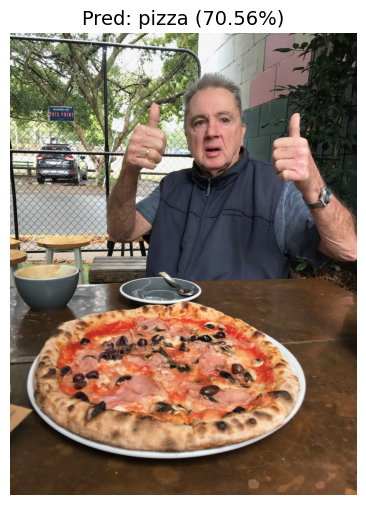

('pizza', 70.56132555007935)

In [ ]:
# Download custom image
import requests

# Setup custom image path
custom_image_path = data_path / "04-pizza-dad.jpeg"

# Download the image if it doesn't exist
if not custom_image_path.exists():
    # Download with requests
    print(f"Downloading {custom_image_path}...")
    request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
    with open(custom_image_path, "wb") as f:
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")

# Predict on custom image
pred_and_plot_image(
    model=effnet,
    image_path=custom_image_path,
    class_names=class_names,
    transform=weights.transforms(), # use the automatic transforms from pretrained weights
    image_size=(224, 224)
)

# 7.ViT Model

In [ ]:
vit = torchvision.models.vit_b_16() # Instantiate the model
vit.heads #last layers

Sequential(
  (head): Linear(in_features=768, out_features=1000, bias=True)
)

In [ ]:
def create_vit_model(
    num_of_classes: int=3,
    seed: int = 42
):

# create vit pretrained weights,transform and model
  vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT
  vit_transform = vit_weights.transforms()
  vit_model = torchvision.models.vit_b_16(weights=vit_weights)

  # freeze all layers in model
  for param in vit_model.parameters():
    param.requires_grad = False

  # change classifier head with random seed for reproducibility
  torch.manual_seed(seed)
  vit_model.heads = nn.Sequential(
      nn.Linear(in_features=768,
                out_features=num_of_classes,
                bias=True)
  )

  return vit_model, vit_transform



In [ ]:
vit_model, vit_transform = create_vit_model(num_of_classes=3, seed=42)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:03<00:00, 96.2MB/s]


In [ ]:
from torchinfo import summary
summary(vit_model,
        input_size=(1, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)


Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [1, 3, 224, 224]     [1, 3]               768                  Partial
├─Conv2d (conv_proj)                                         [1, 3, 224, 224]     [1, 768, 14, 14]     (590,592)            False
├─Encoder (encoder)                                          [1, 197, 768]        [1, 197, 768]        151,296              False
│    └─Dropout (dropout)                                     [1, 197, 768]        [1, 197, 768]        --                   --
│    └─Sequential (layers)                                   [1, 197, 768]        [1, 197, 768]        --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [1, 197, 768]        [1, 197, 768]        (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [1, 197, 768]        [1, 1

## 7.1 create Dataloaders for ViT

In [ ]:
# setup vit dataloaders
vit_train_dataloader, vit_test_dataloader, class_names = create_dataloader(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=vit_transform,
    batch_size=32,

)

Class names: ['pizza', 'steak', 'sushi']


## 7.2 Training vit feature extractor

In [ ]:
optimizer = torch.optim.Adam(params=vit_model.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()
# train vit model with seed
vit_results = train(model=vit_model,
                               train_dataloader=vit_train_dataloader,
                               test_dataloader=vit_test_dataloader,
                               optimizer=optimizer,
                               loss_fn=loss_fn,
                               epochs=5,
                               device=device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.2825 | train_acc: 0.9110 | test_loss: 0.0922 | test_acc: 0.9727
Epoch: 2 | train_loss: 0.1226 | train_acc: 0.9594 | test_loss: 0.0776 | test_acc: 0.9766
Epoch: 3 | train_loss: 0.0968 | train_acc: 0.9705 | test_loss: 0.0686 | test_acc: 0.9779
Epoch: 4 | train_loss: 0.0794 | train_acc: 0.9758 | test_loss: 0.0664 | test_acc: 0.9766
Epoch: 5 | train_loss: 0.0677 | train_acc: 0.9824 | test_loss: 0.0627 | test_acc: 0.9805


## 7.3 Inspecting ViT Loss curves

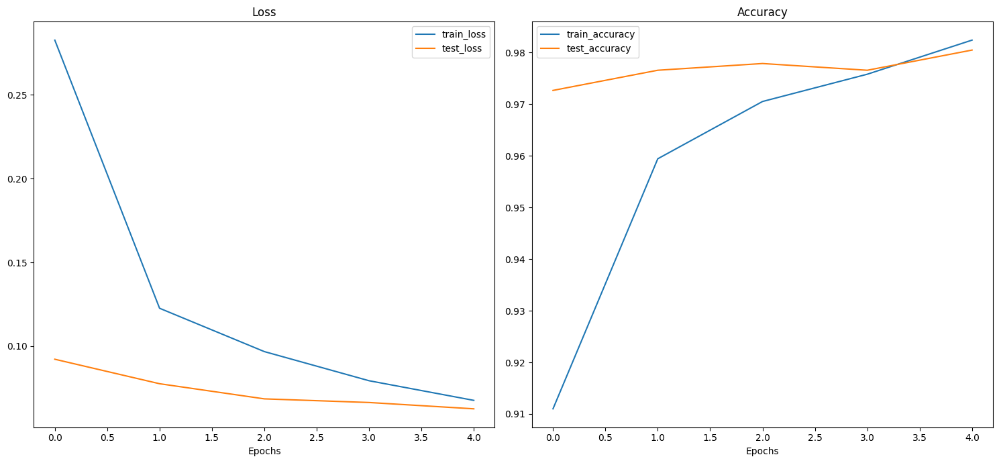

In [ ]:
plot_loss_curves(vit_results)

## 7.4 Saving ViT feature extractor

In [ ]:
# save the model
save_model(model=vit_model,
           target_dir="models",
           model_name="01_vit_b_16_custom_pizza_steak_sushi.pth")


[INFO] Saving model to: models/01_vit_b_16_custom_pizza_steak_sushi.pth


## 7.5 checking the size of ViT feature extractor

In [ ]:
from pathlib import Path

# Check the size of the model
pretrained_vit_model_size = Path("models/01_vit_b_16_custom_pizza_steak_sushi.pth").stat().st_size
print(f"Pretrained ViT Model Size: {pretrained_vit_model_size:,} MB")


Pretrained ViT Model Size: 343,269,301 MB


In [ ]:
pretrained_effnet_model_size=Path("/content/models/01_effnetb0_custom_pizza_steak_sushi.pth").stat().st_size
print(f"Pretrained EffNet Model Size: {pretrained_effnet_model_size:,} MB")

Pretrained EffNet Model Size: 16,349,989 MB


In [ ]:
# count number of parameters in vit
vit_total_params = sum(p.numel() for p in vit_model.parameters())
print(f"Total number of parameters in ViT model: {vit_total_params}")

Total number of parameters in ViT model: 85800963


In [ ]:
# count number of paraeters in effnet
eff_total_params = sum(p.numel() for p in effnetModel_loaded.parameters())
print(f"Total number of parameters in EffNet model: {eff_total_params}")

Total number of parameters in EffNet model: 4011391


In [ ]:
# create vit statistics dictionary
vit_stats={
    "test_loss": vit_results["test_loss"][-1],
    "test_acc": vit_results["test_acc"][-1],
    "number_of_parameters":vit_total_params,
    "model_size": pretrained_vit_model_size
}
vit_stats


{'test_loss': 0.06266196645689585,
 'test_acc': 0.98046875,
 'number_of_parameters': 85800963,
 'model_size': 343269301}

In [ ]:
effnet_stats={
    "test_loss":results["test_loss"][-1],
    "test_acc": results["test_acc"][-1],
    "number_of_parameters":eff_total_params,
    "model_size": pretrained_effnet_model_size}
effnet_stats

{'test_loss': 0.18717470671981573,
 'test_acc': 0.9440104166666666,
 'number_of_parameters': 4011391,
 'model_size': 16349989}

# 8. ViT Model with HuggingFace Trainer Model

In [ ]:
from datasets import Dataset
import pandas as pd

In [ ]:
labels_=["pizza","steak","sushi"]

In [ ]:
class_names=labels_

In [ ]:
id2label={i:label for i, label in enumerate(class_names)}
label2id={label:id for id, label in id2label.items()}
id2label

{0: 'pizza', 1: 'steak', 2: 'sushi'}

In [ ]:
o_train_path_='/content/data/pizza_steak_sushi/pizza_steak_sushi/train'
o_test_path_='/content/data/pizza_steak_sushi/pizza_steak_sushi/test'

In [ ]:
train_path=[o_train_path_+'/'+label for label in labels_]
test_path=[o_test_path_+'/'+label for label in labels_]

In [ ]:
train_path

['/content/data/pizza_steak_sushi/pizza_steak_sushi/train/pizza',
 '/content/data/pizza_steak_sushi/pizza_steak_sushi/train/steak',
 '/content/data/pizza_steak_sushi/pizza_steak_sushi/train/sushi']

In [ ]:
def createDataFrame(paths_):
    df_ = pd.DataFrame(columns=['imgPath', 'label'])

    for path_ in paths_:
        list_img = [os.path.join(path_, file) for file in os.listdir(path_)]
        # Corrected: Use square brackets to access dictionary values
        list_label = [label2id[path_.split('/')[-1]] for _ in range(len(list_img))]
        mydf = pd.DataFrame(list(zip(list_img, list_label)), columns=['imgPath', 'label'])

        # Use concat instead of append
        df_ = pd.concat([df_, mydf], ignore_index=True)

    # Shuffling the dataframe
    df_ = df_.sample(frac=1, random_state=0).reset_index(drop=True)

    return df_

In [ ]:
train_df=createDataFrame(train_path)
test_df=createDataFrame(test_path)

In [ ]:
train_df

,imgPath,label
0,/content/data/pizza_steak_sushi/pizza_steak_su...,1
1,/content/data/pizza_steak_sushi/pizza_steak_su...,0
2,/content/data/pizza_steak_sushi/pizza_steak_su...,1
3,/content/data/pizza_steak_sushi/pizza_steak_su...,1
4,/content/data/pizza_steak_sushi/pizza_steak_su...,2
...,...,...
2245,/content/data/pizza_steak_sushi/pizza_steak_su...,1
2246,/content/data/pizza_steak_sushi/pizza_steak_su...,2
2247,/content/data/pizza_steak_sushi/pizza_steak_su...,1
2248,/content/data/pizza_steak_sushi/pizza_steak_su...,1


In [ ]:
test_df

,imgPath,label
0,/content/data/pizza_steak_sushi/pizza_steak_su...,1
1,/content/data/pizza_steak_sushi/pizza_steak_su...,0
2,/content/data/pizza_steak_sushi/pizza_steak_su...,1
3,/content/data/pizza_steak_sushi/pizza_steak_su...,0
4,/content/data/pizza_steak_sushi/pizza_steak_su...,2
...,...,...
745,/content/data/pizza_steak_sushi/pizza_steak_su...,2
746,/content/data/pizza_steak_sushi/pizza_steak_su...,0
747,/content/data/pizza_steak_sushi/pizza_steak_su...,2
748,/content/data/pizza_steak_sushi/pizza_steak_su...,2


In [ ]:
train_ds=Dataset.from_pandas(train_df)
test_ds=Dataset.from_pandas(test_df)

In [ ]:
test_ds

Dataset({
    features: ['imgPath', 'label'],
    num_rows: 750
})

In [ ]:
train_ds[0]['label']

1

In [ ]:
id2label[train_ds[0]['label']]

'steak'

### **Processing The data**

In [ ]:
import albumentations as A
from datasets import Dataset
import cv2

In [ ]:
from transformers import ViTFeatureExtractor
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
feature_extractor

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/vit/feature_extraction_vit.py:30: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


ViTFeatureExtractor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTFeatureExtractor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [ ]:
normalize=A.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)

In [ ]:
# Augmantation for training data
train_aug = A.Compose(
    [
        A.RandomResizedCrop(height=224, width=224, size=(224, 224)),
        A.Resize(224, 224),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        normalize,

    ]
)
val_aug = A.Compose(
    [
        A.Resize(224, 224),
        A.CenterCrop(height=224, width=224),
        normalize,
    ]
)

/tmp/ipython-input-13952586.py:4: UserWarning: Argument(s) 'height, width' are not valid for transform RandomResizedCrop
  A.RandomResizedCrop(height=224, width=224, size=(224, 224)),


In [ ]:
def train_transforms_(examples):
  img_tensor_list=[]
  for iPath in examples['imgPath']:
    img=cv2.imread(iPath)
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img=train_aug(image=img)['image']
    # Convert numpy array to torch tensor and permute dimensions
    img = torch.from_numpy(img).permute(2, 0, 1)
    img_tensor_list.append(img)

  examples['imgPath']=img_tensor_list
  return examples

def val_transforms_(examples):
  img_tensor_list=[]
  for iPath in examples['imgPath']:
    img=cv2.imread(iPath)
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img=val_aug(image=img)['image']
    # Convert numpy array to torch tensor and permute dimensions
    img = torch.from_numpy(img).permute(2, 0, 1)
    img_tensor_list.append(img)

  examples['imgPath']=img_tensor_list
  return examples

In [ ]:
train_ds.set_transform(train_transforms_)
test_ds.set_transform(val_transforms_)

In [ ]:
train_ds[0]

{'imgPath': tensor([[[ 1.0000,  0.9373,  0.6078,  ...,  0.6549,  0.6941,  0.6706],
          [ 0.9686,  0.9843,  0.7255,  ...,  0.9294,  0.8980,  0.9059],
          [ 0.7647,  0.9608,  0.7490,  ...,  0.9922,  0.9373,  0.7020],
          ...,
          [-0.1922, -0.1843, -0.1922,  ...,  0.2549, -0.1059,  0.0353],
          [-0.1373, -0.1059, -0.1216,  ..., -0.0275, -0.2471, -0.1608],
          [-0.0745, -0.0510, -0.0588,  ..., -0.0588, -0.1373, -0.1529]],
 
         [[ 0.5373,  0.4588,  0.1059,  ...,  0.2157,  0.3098,  0.3098],
          [ 0.4824,  0.5765,  0.2471,  ...,  0.5373,  0.5294,  0.5608],
          [ 0.2941,  0.6000,  0.2706,  ...,  0.6471,  0.6549,  0.3412],
          ...,
          [-0.8431, -0.8353, -0.8510,  ...,  0.0196, -0.3490, -0.2157],
          [-0.7882, -0.7569, -0.7725,  ..., -0.2941, -0.5059, -0.4431],
          [-0.7255, -0.6784, -0.6863,  ..., -0.3255, -0.4118, -0.4588]],
 
         [[ 0.9373,  0.8588,  0.5216,  ...,  0.6078,  0.6941,  0.6941],
          [ 0.882

In [ ]:
from torch.utils.data import DataLoader
import torch

def collate_fn(examples):
  pixel_values=torch.stack([example['imgPath'] for example in examples])
  labels=torch.tensor([example['label'] for example in examples])
  return {'pixel_values': pixel_values, 'labels': labels}

train_dataloader = DataLoader(train_ds, collate_fn=collate_fn, batch_size=32, shuffle=True)
#eval_dataloader = DataLoader(test_ds, collate_fn=collate_fn, batch_size=32)

In [ ]:
batch=next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)


pixel_values torch.Size([32, 3, 224, 224])
labels torch.Size([32])


In [ ]:
# define model
from transformers import ViTForImageClassification
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224',
                                                  num_labels=3,
                                                  id2label=id2label,
                                                  label2id=label2id,
                                                  ignore_mismatched_sizes=True)

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([3]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([3, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
import torch
import torch.nn as nn
import torchvision

In [ ]:
!pip install torchinfo

In [ ]:
from torchinfo import summary
summary(model,
        input_size=(1, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                                Input Shape          Output Shape         Param #              Trainable
ViTForImageClassification (ViTForImageClassification)                  [1, 3, 224, 224]     [1, 3]               --                   True
├─ViTModel (vit)                                                       [1, 3, 224, 224]     [1, 197, 768]        --                   True
│    └─ViTEmbeddings (embeddings)                                      [1, 3, 224, 224]     [1, 197, 768]        152,064              True
│    │    └─ViTPatchEmbeddings (patch_embeddings)                      [1, 3, 224, 224]     [1, 196, 768]        590,592              True
│    │    └─Dropout (dropout)                                          [1, 197, 768]        [1, 197, 768]        --                   --
│    └─ViTEncoder (encoder)                                            [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─ModuleList (

In [ ]:
from transformers import TrainingArguments
metric_name = "accuracy"

args = TrainingArguments(
    output_dir="vit-base-beans",
    save_strategy="epoch",
    eval_strategy="epoch",
    logging_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    num_train_epochs=3,
    weight_decay=0.01,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    logging_dir='logs',
    remove_unused_columns=False,
    report_to="none", # Disable Weights & Biases logging

)

In [ ]:
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 4.5 MB/s eta 0:00:00


In [ ]:
!pip install datasets

In [ ]:
!pip install matplotlib-venn
!apt-get -qq install -y libfluidsynth1
# https://pypi.python.org/pypi/libarchive
!apt-get -qq install -y libarchive-dev && pip install -U libarchive
import libarchive
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install pydot
import pydot
!pip install cartopy
import cartopy

E: Package 'libfluidsynth1' has no installation candidate
Selecting previously unselected package libarchive-dev:amd64.
(Reading database ... 126675 files and directories currently installed.)
Preparing to unpack .../libarchive-dev_3.6.0-1ubuntu1.5_amd64.deb ...
Unpacking libarchive-dev:amd64 (3.6.0-1ubuntu1.5) ...
Setting up libarchive-dev:amd64 (3.6.0-1ubuntu1.5) ...
Processing triggers for man-db (2.10.2-1) ...
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 5.8 MB/s eta 0:00:00
  Created wheel for libarchive: filename=libarchive-0.4.7-py3-none-any.whl size=31629 sha256=5ac8f7e58c9b4f5627737c708c615824216ecad88b935d13e7d570ce421e4d3c
  Stored in directory: /root/.cache/pip/wheels/29/20/ab/f101da7b245b996aa097685ef742243725ea6150f5b3b6d9ed
Successfully built libarchive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 56.5 MB/s eta 0:00:00


In [ ]:
import numpy as np
import evaluate # Import the evaluate library

metric = evaluate.load("accuracy", trust_remote_code=True) # Load the accuracy metric from the Hugging Face datasets library

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    # Take the index of the highest predicted probability for each example
    predictions = np.argmax(predictions, axis=1)
    # Compute accuracy using the metric
    return metric.compute(predictions=predictions, references=labels)

In [ ]:
import torch
from transformers import Trainer # Import Trainer

trainer=Trainer(
    model,
    args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    # tokenizer=feature_extractor, # Removed: Use processing_class instead
    processing_class=feature_extractor, # Added: Use processing_class

)

## Train model

In [ ]:
# start tensorboard
%load_ext tensorboard
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# train the model
train_output=trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,0.272100,0.043077,0.989333
2,0.078700,0.029683,0.992000
3,0.058200,0.027360,0.992000


In [ ]:
eval_results=trainer.evaluate()
eval_results

{'eval_loss': 0.02968260645866394,
 'eval_accuracy': 0.992,
 'eval_runtime': 11.4586,
 'eval_samples_per_second': 65.453,
 'eval_steps_per_second': 2.095,
 'epoch': 3.0}

### **Save Best Model**

In [ ]:
new_model_path='/content/foodvision_vit_trainer'

In [ ]:
#save last trained weights
trainer.save_model(f"{new_model_path}/bestVIT")

In [ ]:
model_Out=ViTForImageClassification.from_pretrained(f"{new_model_path}/bestVIT",
                                                    num_labels=3,
                                                    id2label=id2label,
                                                    label2id=label2id)

In [ ]:
torch.save(model_Out.state_dict(), f"{new_model_path}/bestVIT.pth")

## Check sizes of Models

In [ ]:
from pathlib import Path

# Get the model size in bytes then convert to megabytes
pretrained_vit_trainer_model_size = Path("/content/foodvision_vit_trainer/bestVIT.pth").stat().st_size // (1024 * 1024)  # division converts bytes to megabytes
print(f"Pretrained ViT Trainer model size: {pretrained_vit_trainer_model_size} MB")

# Get the model size in bytes then convert to megabytes
# Assuming these files exist from previous steps or are placeholders
# Replace with actual paths if needed
pretrained_vit_model_size = Path("models/pretrained_vit_model_pizza_steak_sushi_data.pth").stat().st_size // (1024 * 1024)  # division converts bytes to megabytes
print(f"Pretrained ViT feature extractor model size: {pretrained_vit_model_size} MB")

# Get the model size in bytes then convert to megabytes
# Assuming these files exist from previous steps or are placeholders
# Replace with actual paths if needed
pretrained_effnet_model_size = Path("models/02_pretrained_effnet_model1.pth").stat().st_size // (1024 * 1024)  # division converts bytes to megabytes
print(f"Pretrained EffNet model size: {pretrained_effnet_model_size} MB")

Pretrained ViT Trainer model size: 327 MB


FileNotFoundError: [Errno 2] No such file or directory: 'models/pretrained_vit_model_pizza_steak_sushi_data.pth'

### **Evaluation**

In [ ]:
outputs=trainer.predict(test_ds)

In [ ]:
print(outputs.metrics)

{'test_loss': 0.02078617922961712, 'test_accuracy': 0.9946666666666667, 'test_runtime': 10.2627, 'test_samples_per_second': 73.08, 'test_steps_per_second': 2.339}


In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

y_true=outputs.label_ids
y_pred=outputs.predictions.argmax(1)

labels=class_names
# cm=confusion_matrix(y_true, y_pred)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc={'figure.figsize':(10,10)})

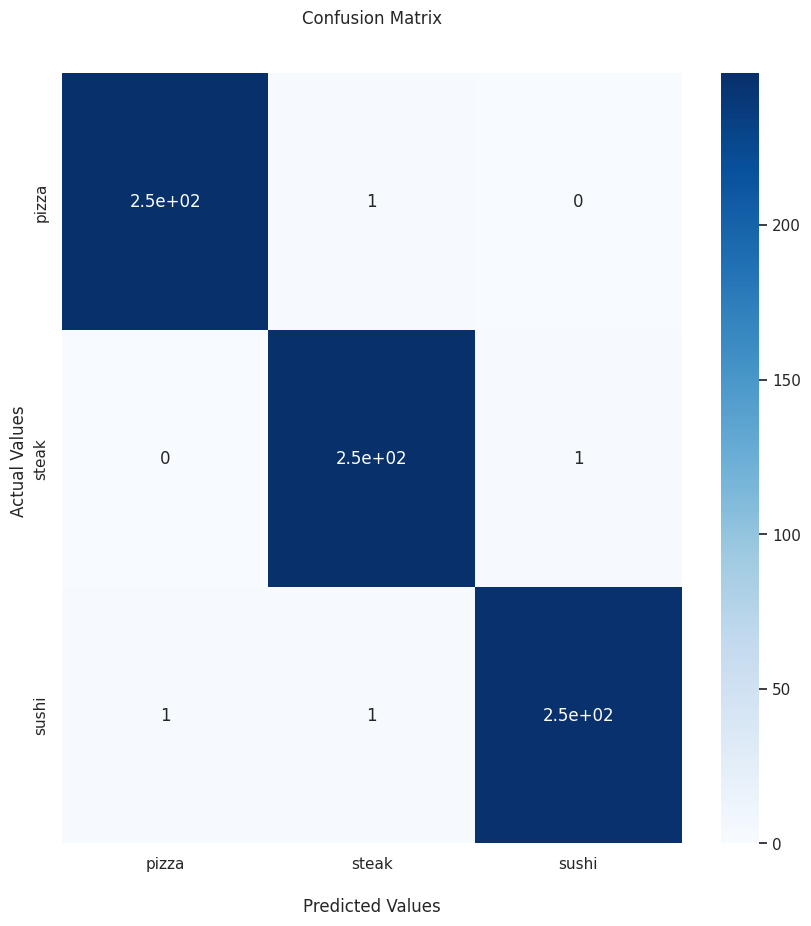

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,accuracy_score,roc_curve,auc,classification_report
confusionmatrix=confusion_matrix(y_true, y_pred)

ax=sns.heatmap(confusion_matrix(y_true, y_pred), annot=True,cmap='Blues')
ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

plt.show()

In [ ]:
print(classification_report(y_true,y_pred,target_names=labels))

              precision    recall  f1-score   support

       pizza       1.00      1.00      1.00       250
       steak       0.99      1.00      0.99       250
       sushi       1.00      0.99      0.99       250

    accuracy                           0.99       750
   macro avg       0.99      0.99      0.99       750
weighted avg       0.99      0.99      0.99       750



In [ ]:
import torch # The 'torch' library is required for these blocks

# Calculate total number of parameters for a ViT Trainer model
# The output is shown as 85,800,963 parameters.
vit_trainer_total_params = sum(p.numel() for p in model_Out.parameters())
# Output: 85800963

# Count number of parameters in the base ViT model
# NOTE: 'vit' must be the ViT model object
vit_total_params = sum(torch.numel(param) for param in vit.parameters())
vit_total_params

# Count number of parameters in an EfficientNet model
# NOTE: 'effnet' must be the EfficientNet model object
eff_total_params = sum(torch.numel(param) for param in effnet.parameters())
eff_total_params

In [ ]:
from pathlib import Path

# Get the model size in bytes then convert to megabytes
pretrained_vit_trainer_model_size = Path("/content/foodvision_vit_trainer/bestVIT.pth").stat().st_size // (1024 * 1024)  # division converts bytes to megabytes
print(f"Pretrained ViT Trainer model size: {pretrained_vit_trainer_model_size} MB")

Pretrained ViT Trainer model size: 327 MB


In [ ]:
import torch # The 'torch' library is required for these blocks

# Calculate total number of parameters for a ViT Trainer model
# The output is shown as 85,800,963 parameters.
vit_trainer_total_params = sum(p.numel() for p in model_Out.parameters())

In [ ]:
# Create ViT statistics dictionary
vit_trainer_stats = {
    "test_loss": eval_results["eval_loss"],
    "test_acc": eval_results["eval_accuracy"],
    "number_of_parameters": vit_trainer_total_params,
    "model_size (MB)": pretrained_vit_trainer_model_size
}

vit_trainer_stats

{'test_loss': 0.02078617922961712,
 'test_acc': 0.9946666666666667,
 'number_of_parameters': 85800963,
 'model_size (MB)': 327}

In [ ]:
# Create ViT statistics dictionary
vit_stats = {
    "test_loss": vit_results["test_loss"][-1],
    "test_acc": vit_results["test_acc"][-1],
    "number_of_parameters": vit_total_params,
    "model_size (MB)": pretrained_vit_model_size
}

vit_stats
# Output:
# {'test_loss': 0.17953963577747345,
#  'test_acc': 0.9176136363636364,
#  'number_of_parameters': 85800963,
#  'model_size (MB)': 327}


# Create EfficientNet statistics dictionary
effnet_stats = {
    "test_loss": results["test_loss"][-1],
    "test_acc": results["test_acc"][-1],
    "number_of_parameters": eff_total_params,
    "model_size (MB)": pretrained_effnet_model_size
}

## 9. Making Predictions with our trained models

In [ ]:
from pathlib import Path

print(f"[INFO] Finding all filepaths ending with'.jpg' in directory:{test_dir}")
test_data_paths= list(Path(test_dir).glob("'/'.jpg"))
test_data_paths[:5]

In [ ]:
def pred_and_store(paths: List[Path],
                   model: torch.nn.Module,
                   transform: torchvision.transforms,
                   class_names: List[str],
                   device: str = "cuda" if torch.cuda.is_available() else "cpu") -> List[Dict]:
    """
    Performs model inference on image paths and logs the results.

    NOTE: This signature combines information from multiple context images.
    """
    # 2. Create an empty list to store prediction dictionaires
    pred_list = []

    # Prepare model for inference
    model.to(device)
    model.eval()

    # 3. Loop through target paths using a progress bar
    for path in tqdm(paths):

        # 4. Create empty dictionary to store prediction information for each sample
        pred_dict = {}

        # 5. Get the sample path and ground truth class name
        pred_dict["image_path"] = path
        class_name = path.parent.stem
        pred_dict["class_name"] = class_name

        # 6. Start the prediction timer
        start_time = timer()

        # 7. Open image path
        img = Image.open(path).convert('RGB') # Ensure RGB for standard models

        # 8. Transform the image, add batch dimension, and put image on target device
        # .unsqueeze(0) adds the batch dimension
        transformed_image = transform(img).unsqueeze(0).to(device)

        # 10. Get prediction probability, prediction label and prediction class
        with torch.inference_mode():
            # Perform inference on target sample
            pred_logit = model(transformed_image)

            # Try/except block handles different model output structures (e.g., Hugging Face vs. standard PyTorch)
            try:
                pred_logit = pred_logit.logits
            except:
                pred_logit = pred_logit

            # Turn logits into prediction probabilities using softmax
            pred_prob = torch.softmax(pred_logit, dim=1)

            # Get the index (label) with the highest probability
            pred_label = torch.argmax(pred_prob, dim=1)

            # Convert the predicted numerical label to a class name string
            # .cpu() ensures array access is on the CPU
            pred_class = class_names[pred_label.cpu().item()]

        # 11. Make sure things in the dictionary are on CPU (required for inspecting predictions later on)
        # .unsqueeze(0).max().cpu().item() gets the max probability scalar to put on CPU
        pred_dict["pred_prob"] = round(pred_prob.unsqueeze(0).max().cpu().item(), 4)
        pred_dict["pred_class"] = pred_class

        # 12. End the timer and calculate time per pred
        end_time = timer()
        pred_dict["time_for_pred"] = round(end_time - start_time, 4)

        # 13. Does the pred match the true label?
        pred_dict["correct"] = class_name == pred_class

        # 14. Add the dictionary to the list of preds
        pred_list.append(pred_dict)

    # 15. Return list of prediction dictionaries
    return pred_list

In [ ]:
# Make predictions across test dataset with EffNetB2
# NOTE: This assumes pred_and_store, effnet, auto_transforms, class_names, and test_data_paths are defined.
effnet_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                        model=effnet,
                                        transform=auto_transforms,
                                        class_names=class_names,
                                        device="cpu") # make predictions on CPU

In [ ]:
#inspect 2 prediction dictionaries
effnet_test_pred_dicts[10:12]


In [ ]:
 # turn test predict into dataframes
 import pandas as pd
 effnet_test_pred_df = pd.DataFrame(effnet_test_pred_dicts)
 effnet_test_pred_df.head()

In [ ]:
# check numbers of correct predictions
effnet_test_pred_df.correct.value_counts()

In [ ]:
#find average time per predictions
effnet_average_time_per_pred=round(effnet_test_pred_df.time_for_pred.mean(),4)
print(f"Average time per prediction: {effnet_average_time_per_pred} seconds")

In [ ]:
# Make list of prediction dictionaries with ViT feature extractor model on test images
vit_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                     model=vit,
                                     transform=vit_transforms,
                                     class_names=class_names,
                                     device="cpu")



In [ ]:
# Make predictions across test dataset with EffNetB2
effnet_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                        model=effnet,
                                        transform=auto_transforms,
                                        class_names=class_names,
                                        device="cpu") # make predictions on CPU

In [ ]:
vit_test_pred_dicts[10:12]

In [ ]:
# turn vit test into data frames
vit_test_pred_df = pd.DataFrame(vit_test_pred_dicts)
vit_test_pred_df.head()

In [ ]:
# NOTE: Assume vit, effnet, model_Out (ViT Trainer), transforms, test_data_paths, and class_names are defined.

# Calculate Model Sizes (in MB)
pretrained_vit_trainer_model_size = Path("models/pretr..._trainer_model_pizza_steak_sushi_data.pth").stat().st_size // (1024*1024)
print(f"Pretrained ViT feature extractor model size: {pretrained_vit_trainer_model_size} MB") # Output: 327 MB

pretrained_vit_model_size = Path("models/pretrained_vit_model_pizza_steak_sushi_data.pth").stat().st_size // (1024*1024)
print(f"Pretrained ViT feature extractor model size: {pretrained_vit_model_size} MB") # Output: 327 MB

pretrained_effnet_model_size = Path("models/B2/pretrained_effnet_model.pth").stat().st_size // (1024*1024)
print(f"Pretrained ViT feature extractor model size: {pretrained_effnet_model_size} MB")


# Calculate Total Parameters
vit_trainer_total_params = sum(p.numel() for p in model_Out.parameters()) # Output: 85800963
# vit_trainer_total_params

vit_total_params = sum(torch.numel(param) for param in vit.parameters()) # Count parameters in ViT
# vit_total_params

eff_total_params = sum(torch.numel(param) for param in effnet.parameters()) # Count parameters in EfficientNet
# eff_total_params


# Run Predictions
# ViT Trainer model predictions
vit_trainer_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                             model=model_Out,
                                             transform=vit_transforms,
                                             class_names=class_names,
                                             device="cpu")

# ViT model predictions
vit_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                     model=vit,
                                     transform=vit_transforms,
                                     class_names=class_names,
                                     device="cpu")

# EfficientNet model predictions
effnet_test_pred_dicts = pred_and_store(paths=test_data_paths,
                                        model=effnet,
                                        transform=auto_transforms,
                                        class_names=class_names,
                                        device="cpu")


# Store Statistics in Dictionaries
# ViT Trainer statistics
vit_trainer_stats = {
    "test_loss": eval_results["eval_loss"],
    "test_acc": eval_results["eval_accuracy"],
    "number_of_parameters": vit_trainer_total_params,
    "model_size (MB)": pretrained_vit_trainer_model_size
}
# vit_trainer_stats

# ViT statistics (with example output)
vit_stats = {
    "test_loss": vit_results["test_loss"][-1],
    "test_acc": vit_results["test_acc"][-1],
    "number_of_parameters": vit_total_params,
    "model_size (MB)": pretrained_vit_model_size
}
# vit_stats

# Calculate and add average prediction time for ViT
# Assuming 'vit_test_pred_df' is a DataFrame created from vit_test_pred_dicts
vit_average_time_per_pred = round(vit_test_pred_df.time_for_pred.mean(), 4)
print(f"ViT average time per prediction: {vit_average_time_per_pred} seconds") # Output: 0.6929 seconds

vit_stats["time_per_pred_cpu"] = vit_average_time_per_pred
# vit_stats # Updated ViT stats

# EfficientNet statistics
effnet_stats = {
    "test_loss": results["test_loss"][-1],
    "test_acc": results["test_acc"][-1],
    "number_of_parameters": eff_total_params,
    "model_size (MB)": pretrained_effnet_model_size
}

# Inspect Predictions
# Inspect 2 prediction dictionaries
# effnet_test_pred_dicts[10:12]

# 10. Comparing model results, predictions,time and size

In [ ]:
import pandas as pd # Import assumed for pd.DataFrame

# Turn stat dictionaries into DataFrame
# Assumes 'effnet_stats', 'vit_stats', and 'vit_trainer_stats' dictionaries are defined
df = pd.DataFrame([effnet_stats, vit_stats, vit_trainer_stats]) #

# Add column for model names
df["model"] = ["EffNet", "ViT", "ViT Trainer"] #

# Convert accuracy to percentages
df["test_acc"] = round(df["test_acc"] * 100, 2) #

df

# 11. Bringing FoodVisionApp using Gradio


In [ ]:
# import/Install Gradio
try:
  import gradio as gr
except:
  !pip -q install gradio
  import gradio as gr
print(f"Gradio version: {gr.__version__}")

Gradio version: 5.49.0


It defines a function to map input → transform → prediction (with EfficientNet) → output (prediction, probability, time taken):

In [ ]:
effnet.to("cpu")

next(iter(effnet.parameters())).device

device(type='cpu')

In [ ]:
from typing import Tuple, Dict
import torch
from timeit import default_timer as timer

def predict(img) -> Tuple[Dict[str, float], float]:
    """
    Transforms and performs a prediction on an image and returns
    prediction probabilities and time taken.
    """
    # Start the timer
    start_time = timer()

    # Transform the target image and add a batch dimension
    img = auto_transforms(img).unsqueeze(0)

    # Put model into evaluation mode and turn on inference mode
    effnet.eval()
    with torch.inference_mode():
        # Pass the transformed image through the model and
        # turn the prediction logits into prediction probabilities
        pred_probs = torch.softmax(effnet(img), dim=1)

    # Create a prediction label and prediction probability dictionary
    # for each prediction class
    pred_labels_and_probs = {
        class_names[i]: float(pred_probs[0][i])
        for i in range(len(class_names))
    }

    # Calculate the prediction time
    pred_time = round(timer() - start_time, 5)

    return pred_labels_and_probs, pred_time


In [ ]:
import random
from PIL import Image

test_data_paths=list(Path(test_dir).glob("*/*.jpg"))

random_image_path=random.sample(test_data_paths, k=1)[0]

image=Image.open(random_image_path)
print(f"[INFO] Predicting on image at path: {random_image_path}")
pred_dict, pred_time = predict(img=image)
print("Prediction label and probability dictionary: \n{pred_dict}")
print(pred_dict)
print(f"Prediction time: {pred_time} seconds")

[INFO] Predicting on image at path: data/pizza_steak_sushi/pizza_steak_sushi/test/pizza/3724187.jpg
Prediction label and probability dictionary: 
{pred_dict}
{'pizza': 0.8347262144088745, 'steak': 0.07084006071090698, 'sushi': 0.09443359822034836}
Prediction time: 0.04445 seconds


In [ ]:
example_list=[[str(filepath)] for filepath in random.sample(test_data_paths, k=3)]
example_list

[['data/pizza_steak_sushi/pizza_steak_sushi/test/sushi/1578308.jpg'],
 ['data/pizza_steak_sushi/pizza_steak_sushi/test/steak/730464.jpg'],
 ['data/pizza_steak_sushi/pizza_steak_sushi/test/sushi/258547.jpg']]

In [ ]:
import gradio as gr

title = "FoodVision App 🍕🥩🍣"
description = "An EfficientNet Computer Vision Model to Classify Images of Food as Pizza, Steak or Sushi."
article = "Created at Pytorch Course."

# Create the Gradio demo
demo = gr.Interface(
    fn=predict, # mapping function from input to output
    inputs=gr.Image(type="pil", label="Food Image"), # what are the inputs?
    outputs=[
        gr.Label(num_top_classes=3, label="Predictions"), # our fn has two outputs, therefore we have two outputs here
        gr.Number(label="Prediction time (s)"),
    ],
    examples=example_list,
    title=title,
    description=description,
    article=article,
)

demo.launch(debug=False, # print errors locally?
            share=True) # generate a publically shareable URL?


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://793aac8f9065755f0e.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


#Hagging Face Spaces ?




To create a new text cell in Google Colab, you can do one of the following:

1.  **Click the "+ Text" button** at the top-left of the notebook interface.
2.  **Hover your mouse** between existing cells and click the "+ Text" option that appears.
3.  Use the keyboard shortcut **`Ctrl+M B`** (on Windows/Linux) or **`Cmd+M B`** (on macOS) to create a new text cell below the current cell.
4.  Use the keyboard shortcut **`Ctrl+M A`** (on Windows/Linux) or **`Cmd+M A`** (on macOS) to create a new text cell above the current cell.

Once a text cell is created, you can type directly into it and format the text using Markdown.

In [ ]:
import shutil
from pathlib import Path

# 1. Create an examples directory
# Note: Path("foodvision_demo_path") will create a folder named 'foodvision_demo_path'
# in your current working directory.
foodvision_examples_path = Path("foodvision_demo_path") / "examples"
foodvision_examples_path.mkdir(parents=True, exist_ok=True)

# 2. Collect three random test dataset image paths
# These paths assume a specific directory structure on your local machine.
foodvision_examples = [
    Path('data/pizza_steak_sushi/test/pizza/1503858.jpg'),
    Path('data/pizza_steak_sushi/test/steak/296375.jpg'),
    Path('data/pizza_steak_sushi/test/sushi/1434806.jpg')
]

# 3. Copy the three random images to the examples directory
for example in foodvision_examples:
    # Use example.name to get just the filename (e.g., '1503858.jpg')
    destination = foodvision_examples_path / example.name

    # Print an informative message before copying
    print(f"[INFO] Copying {example} to {destination}")

    # Copy the file, preserving metadata (copy2 is generally preferred over copy)
    try:
        shutil.copy2(src=example, dst=destination)
    except FileNotFoundError:
        # Added a helpful message for when the source file doesn't exist
        print(f"[ERROR] Source file not found: {example}. Please ensure your 'data' directory is set up correctly.")


!ls demos/foodvision/

In [ ]:
example_list = [["examples/" + example] for example in os.listdir(foodvision_examples_path)]
print("Generated example list:")
print(example_list)

In [ ]:
effnet_foodvision_model_path = "models/02_pretrained_effnet_model.pth"

# Create a destination path for our target model
# This splits the source path by '/' and takes the second element (the filename)
effnet_foodvision_model_destination = foodvision_demo_path / Path(effnet_foodvision_model_path).name

# Try to copy the file
try:
    print(f"[INFO] Attempting to copy ({effnet_foodvision_model_path}) to ({effnet_foodvision_model_destination})")

    # Copy the file instead of moving it for safer data handling
    shutil.copy2(src=effnet_foodvision_model_path, dst=effnet_foodvision_model_destination)

except FileNotFoundError:
    print(f"[ERROR] Source model file not found: {effnet_foodvision_model_path}. Please ensure your 'models' directory is set up correctly.")
else:
    print(f"[INFO] Model successfully copied to: {effnet_foodvision_model_destination}")

In [ ]:
%%writefile demos/foodvision/model.py
import torch
import torchvision

from torch import nn

device = "cuda" if torch.cuda.is_available() else "cpu"

def create_effnet_model(num_classes:int=3,
                        seed:int=42):
    """Creates an EfficientNetB0 feature extractor model and transforms.

    Args:
        num_classes (int, optional): number of classes in the classifier head.
        Defaults to 3.
        seed (int, optional): random seed value. Defaults to 42.

    Returns:
        model (torch.nn.Module): EffNetB2 feature extractor model.
        transforms (torchvision.transforms): EffNetB2 image transforms.
    """
    # Create EffNet pretrained weights, transforms and model
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT # .DEFAULT = best available weights
    transforms = weights.transforms()
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)

    # Freeze all layers in base model
    for param in model.parameters():
        param.requires_grad = False

    # Change classifier head with random seed for reproducibility
    torch.manual_seed(seed)
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3, inplace=True),
        nn.Linear(in_features=1280, out_features=num_classes),
    )

    return model, transforms

In [ ]:
### 1. Imports and setup ###
import gradio as gr
import os
import torch
from timeit import default_timer as timer
from typing import Tuple, Dict
from PIL import Image

# NOTE: 'create_effnet_model' is assumed to be in 'model.py'
from model import create_effnet_model

# Setup class names
class_names = ["pizza", "steak", "sushi"]
num_classes = len(class_names)

### 2. Model and transforms preparation ###

# Create EffNetB2 model (num_classes=3)
effnet, effnet_transforms = create_effnet_model(num_classes=num_classes)

# Load saved weights
# NOTE: The weights file '02_pretrained_effnet_model.pth' is required.
effnet.load_state_dict(
    torch.load(
        f="02_pretrained_effnet_model.pth",
        map_location=torch.device("cpu"),  # load to CPU
    )
)

### 3. Predict function ###

# Create predict function
def predict(img: Image) -> Tuple[Dict[str, float], float]:
    """Transforms and performs a prediction on img and returns prediction and time taken."""

    # Start the timer
    start_time = timer()

    # Transform the target image and add a batch dimension
    img = effnet_transforms(img).unsqueeze(0)

    # Put model into evaluation mode and turn on inference mode
    effnet.eval()
    with torch.inference_mode():
        # Pass the transformed image through the model
        pred_logits = effnet(img)
        # Turn the prediction logits into prediction probabilities and remove the batch dimension
        pred_probs = torch.softmax(pred_logits, dim=1).squeeze(0)

    # Create a prediction label and prediction probability dictionary for each prediction class.
    # This is the required format for Gradio's output parameter (gr.Label).
    pred_labels_and_probs = {class_names[i]: float(pred_probs[i]) for i in range(len(class_names))}

    # Calculate the prediction time
    pred_time = round(timer() - start_time, 5)

    # Return the prediction dictionary and prediction time
    return pred_labels_and_probs, pred_time

### 4. Gradio app ###

# Create title, description and article strings
title = "FoodVision App 🍕🥩🍣"
description = "An EfficientNet Computer Vision Model to Classify Images of Food as Pizza, Steak or Sushi."
article = "Created at PyTorch Course."

# Create examples list from "examples/" directory
# NOTE: The 'examples' directory must exist and contain images for this to run.
if os.path.exists("examples"):
    example_list = [[os.path.join("examples", example)] for example in os.listdir("examples")]
else:
    example_list = []

# Create the Gradio demo
demo = gr.Interface(
    fn=predict, # fn is the function to run
    inputs=gr.Image(type="pil"), # what are the inputs? (PIL Image format)
    outputs=[
        gr.Label(num_top_classes=num_classes, label="Predictions"), # output 1: prediction dictionary
        gr.Number(label="Prediction time (s)"), # output 2: prediction time
    ],
    examples=example_list,
    title=title,
    description=description,
    article=article
)

# Launch the demo!
demo.launch()

In [ ]:
%%writefile demos/foodvision/requirements.txt
torch
torchvision
gradio

In [ ]:
!ls demos/foodvision

# Deploying on Hugging Face

In [ ]:
# Change into and then zip the foodvision folder but exclude certain files
!cd demos/foodvision && zip -r ../foodvision.zip -x "*.pyc" "*.ipynb" "__pycache__" "*ipynb_checkpoints"

# Download the zipped FoodVision Mini app (if running in Google Colab)
try:
    from google.colab import files
    files.download("demos/foodvision.zip")
except:
    print("Not running in Google Colab, can't use google.colab.files.download(), please manually download.")